In [1]:
import sqlite3
from prettytable import from_db_cursor

In [2]:
db = sqlite3.connect('books.db')
cur = db.cursor()

In [7]:
cur.execute("SELECT * FROM books")
from_db_cursor(cur)

+----+------------------------------------------------+---------------+-----------+-------+-------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [3]:
cur.execute("SELECT * FROM books")
from_db_cursor(cur)

+----+---------------------------------------------+---------------+-----------+-------+-------+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [5]:

cur.execute("CREATE TABLE comment (comment varchar(100) UNIQUE, BookId INTEGER,  FOREIGN KEY (BookId)  REFERENCES books (id))")
db.commit()

In [6]:
cur.execute("SELECT * FROM comment")
from_db_cursor(cur)

comment,BookId


In [3]:
import matplotlib
import numpy as np
import matplotlib.pyplot as plt

In [16]:
cur.execute("select id, num_pages from books ORDER BY num_pages")
result = cur.fetchall


id = []
pages = []
 
for i in cur:
    id.append(i[0])
    pages.append(i[1])
 
print(id)
print(pages)

[2, 1, 3]
[466, 1280, 1662]


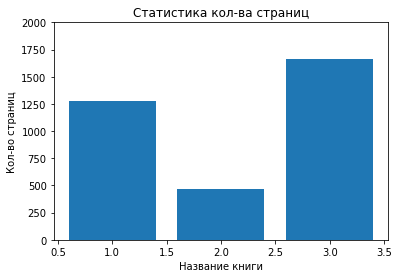

In [18]:
plt.bar(id, pages)
plt.ylim(0, 2000)
plt.xlabel("Название книги")
plt.ylabel("Кол-во страниц")
plt.title("Статистика кол-ва страниц")
plt.show()

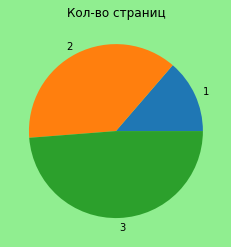

In [28]:
fig, ax = plt.subplots()
fig.set_facecolor('lightgreen')
ax.set_title('Кол-во страниц')

ax.pie(pages, labels=id)

plt.show()

In [4]:
import pandas as pd

In [7]:
df = pd.read_sql("select title,author,size from books", db)
df

,title,author,size
0,Изучаем Python,Лутц Марк,12 МБ
1,"Чистый код - создание, анализ и рефакторинг",Роберт Мартин,33 МБ
2,Цифровая схемотехника и архитектура компьютера,Дэвид Харрис,36 МБ


In [9]:
sql = """SELECT title, author,num_pages, size FROM books WHERE num_pages > 1000"""
df = pd.read_sql(sql, db)
df

,title,author,num_pages,size
0,Изучаем Python,Лутц Марк,1280,12 МБ
1,Цифровая схемотехника и архитектура компьютера,Дэвид Харрис,1662,36 МБ


In [10]:
df.num_pages.mean()

1471.0

In [12]:
df[(df.num_pages > df.num_pages.mean())]

,title,author,num_pages,size
1,Цифровая схемотехника и архитектура компьютера,Дэвид Харрис,1662,36 МБ


In [24]:
data = []
sql = """SELECT title FROM books"""
df = pd.read_sql(sql, db)
for i in df:
    data = df[i].append
data

<bound method Series.append of 0                                    Изучаем Python
1       Чистый код - создание, анализ и рефакторинг
2    Цифровая схемотехника и архитектура компьютера
Name: title, dtype: object>

In [6]:
sql = """SELECT title FROM books"""
df = pd.read_sql(sql, db)
for i in df:
    if df[i].dtype == 'object':
        print((i, df[i].map(len).max()))

('title', 46)
